# Imports

In [1]:
import random
import os
import time
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import plotly.express as px
        
import tensorflow as tf
from tensorflow import keras
import tensorflow_hub as hub
import tensorflow_addons as tfa

import keras_preprocessing
from keras_preprocessing import image
from keras_preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau

from keras import Sequential
from keras.applications import VGG19, VGG16, ResNet50
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import SGD,Adam
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.layers import Flatten, Dense, BatchNormalization, Activation,Dropout

from tensorflow.keras.utils import plot_model
from tensorflow.keras import Model

# Hyperparameters

In [2]:
TRAINING_DIR = './data/images_compressed/'
BATCH_SIZE = 32
IMAGE_SIZE = (224, 224)
EPOCHS = 100
LEARNING_RATE = 0.001

# Data Preprocessing

In [3]:
print(f"There are {len(os.listdir(TRAINING_DIR))} images in training set")

There are 5761 images in training set


In [4]:
file_names = os.listdir(TRAINING_DIR)
file_names[:10]

['00003aeb-ace5-43bf-9a0c-dc31a03e9cd2.jpg',
 '00070a23-9faf-4682-8243-59f307880f4b.jpg',
 '000d31f6-44b5-4758-8d86-c4fcfb234392.jpg',
 '001068a8-86c3-4029-a9d9-1e27015e7e64.jpg',
 '00143901-a14c-4600-960f-7747b4a3a8cd.jpg',
 '00149032-3dd6-426e-9bc0-d53032536a42.jpg',
 '00208c77-ee58-4b63-bc1a-b9b3aa4f1be0.jpg',
 '0028956e-9962-46f0-ad45-2c42f8a59d94.jpg',
 '002e88c2-e0ce-4a4b-9670-eddc3d99accc.jpg',
 '002eb5b8-6541-42a3-9596-0d94f7b866ae.jpg']

In [5]:
data = pd.read_csv('./data/images.csv')

In [6]:
data.head()

,image,sender_id,label,kids
0,4285fab0-751a-4b74-8e9b-43af05deee22,124,Not sure,False
1,ea7b6656-3f84-4eb3-9099-23e623fc1018,148,T-Shirt,False
2,00627a3f-0477-401c-95eb-92642cbe078d,94,Not sure,False
3,ea2ffd4d-9b25-4ca8-9dc2-bd27f1cc59fa,43,T-Shirt,False
4,3b86d877-2b9e-4c8b-a6a2-1d87513309d0,189,Shoes,False


In [7]:
data['image'] = data['image']+'.jpg'
data_1 = data[['image', 'label']]

In [8]:
data_1.head()

,image,label
0,4285fab0-751a-4b74-8e9b-43af05deee22.jpg,Not sure
1,ea7b6656-3f84-4eb3-9099-23e623fc1018.jpg,T-Shirt
2,00627a3f-0477-401c-95eb-92642cbe078d.jpg,Not sure
3,ea2ffd4d-9b25-4ca8-9dc2-bd27f1cc59fa.jpg,T-Shirt
4,3b86d877-2b9e-4c8b-a6a2-1d87513309d0.jpg,Shoes


There are some corrupted images in the dataset, so I used the below script to identify and remove them

In [9]:
import PIL
from pathlib import Path
from PIL import UnidentifiedImageError

path = Path(TRAINING_DIR).rglob("*.jpg")
for img_p in path:
    try:
        img = PIL.Image.open(img_p)
    except PIL.UnidentifiedImageError:
            print(img_p)

data\images_compressed\040d73b7-21b5-4cf2-84fc-e1a80231b202.jpg
data\images_compressed\1d0129a1-f29a-4a3f-b103-f651176183eb.jpg
data\images_compressed\784d67d4-b95e-4abb-baf7-8024f18dc3c8.jpg
data\images_compressed\c60e486d-10ed-4f64-abab-5bb698c736dd.jpg
data\images_compressed\d028580f-9a98-4fb5-a6c9-5dc362ad3f09.jpg


In [10]:
corrupted = ['b72ed5cd-9f5f-49a7-b12e-63a078212a17.jpg', '1d0129a1-f29a-4a3f-b103-f651176183eb.jpg', 'c60e486d-10ed-4f64-abab-5bb698c736dd.jpg', 
            'd028580f-9a98-4fb5-a6c9-5dc362ad3f09.jpg', '040d73b7-21b5-4cf2-84fc-e1a80231b202.jpg', '784d67d4-b95e-4abb-baf7-8024f18dc3c8.jpg']

In [11]:
data_1 = data_1.drop(data_1[data_1['image'].isin(corrupted)].index, axis=0)

In [12]:
data_1[data_1['image'].isin(corrupted)]

,image,label


# Data Visualization

In [13]:
fig = px.bar(data_1['label'].value_counts())
fig.show()

In [14]:
def plot_random_image_from_label(label):
    df = data_1[data_1['label']==label]
    random_index = random.choice(df.index)
    img_path = data_1['image'][random_index]
    complete_path = TRAINING_DIR + '/' + img_path
    image = mpimg.imread(complete_path)
    plt.imshow(image)
    plt.title(label)

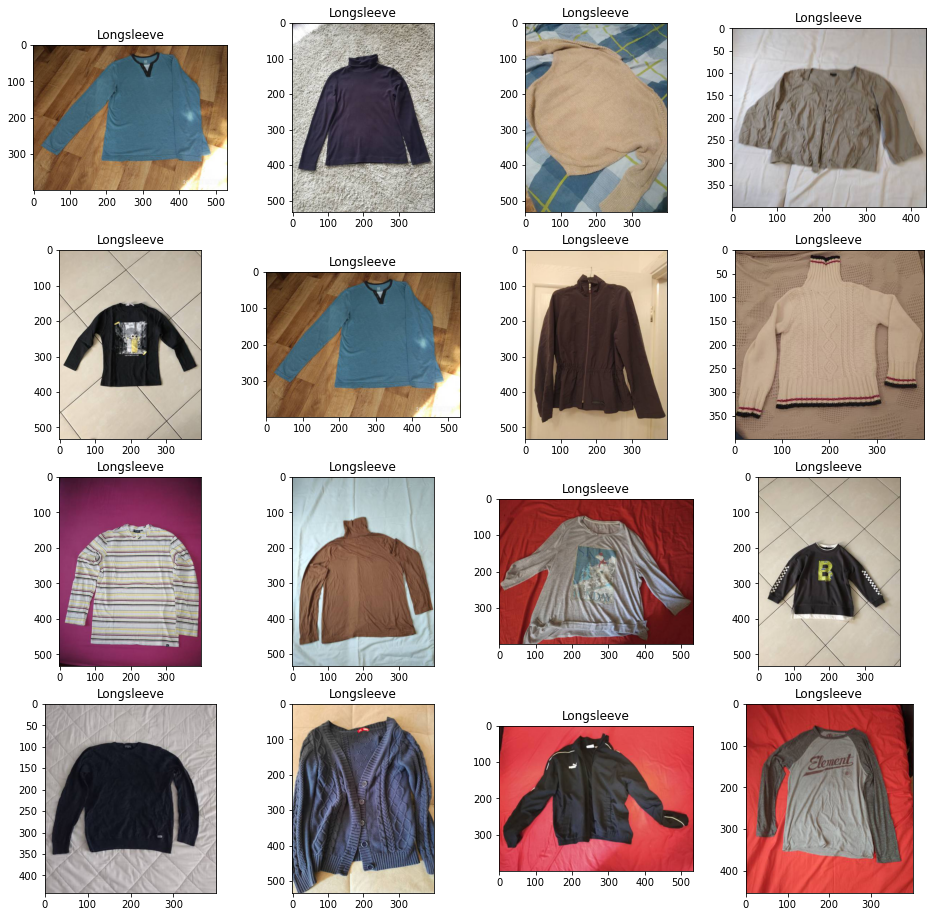

In [15]:
plt.figure(figsize=(16, 16))
for i in range(16):
    ax = plt.subplot(4, 4, i+1)
    plot_random_image_from_label('Longsleeve')

In [16]:
labels_to_remove = ['Skip', 'Not sure', 'Other', 'Blouse', 'Polo', 'Undershirt','Blazer', 'Body', 'Top']

In [17]:
data_1 = data_1[~data_1['label'].isin(labels_to_remove)]

In [18]:
fig = px.bar(data_1['label'].value_counts())
fig.show()

In [19]:
y_train = data_1['label']

In [20]:
label_count = dict(y_train.value_counts())
label_count

{'T-Shirt': 1011,
 'Longsleeve': 699,
 'Pants': 692,
 'Shoes': 431,
 'Shirt': 378,
 'Dress': 357,
 'Outwear': 312,
 'Shorts': 308,
 'Hat': 171,
 'Skirt': 155,
 'Hoodie': 100}

In [21]:
class_names = {'Dress': 0,
 'Hat': 1,
 'Hoodie': 2,
 'Longsleeve': 3,
 'Outwear': 4,
 'Pants': 5,
 'Shirt': 6,
 'Shoes': 7,
 'Shorts': 8,
 'Skirt': 9,
 'T-Shirt': 10}

In [22]:
label_counts = dict()
for label in class_names:
    label_counts[label] = label_count[label]   
label_counts   

{'Dress': 357,
 'Hat': 171,
 'Hoodie': 100,
 'Longsleeve': 699,
 'Outwear': 312,
 'Pants': 692,
 'Shirt': 378,
 'Shoes': 431,
 'Shorts': 308,
 'Skirt': 155,
 'T-Shirt': 1011}

In [23]:
class_weights = []
for label in label_counts:
    class_weights.append(len(data_1)/(len(label_counts)*label_counts[label]))
class_weights

[1.1749427043544691,
 2.452950558213716,
 4.194545454545454,
 0.6000780335544285,
 1.3444055944055944,
 0.6061481870730425,
 1.1096681096681096,
 0.9732124024467412,
 1.3618654073199528,
 2.706158357771261,
 0.4148907472349609]

In [24]:
class_weights= {i : class_weights[i] for i in range(len(label_counts))}
class_weights

{0: 1.1749427043544691,
 1: 2.452950558213716,
 2: 4.194545454545454,
 3: 0.6000780335544285,
 4: 1.3444055944055944,
 5: 0.6061481870730425,
 6: 1.1096681096681096,
 7: 0.9732124024467412,
 8: 1.3618654073199528,
 9: 2.706158357771261,
 10: 0.4148907472349609}

## Plot random images from the training set

In [25]:
def show_random_training_image():
    random_index = random.choice(data_1.index)
    img_path = data_1['image'][random_index]
    label = data_1['label'][random_index]
    complete_path = TRAINING_DIR + '/' + img_path
    image = mpimg.imread(complete_path)
    plt.imshow(image)
    plt.title(label)

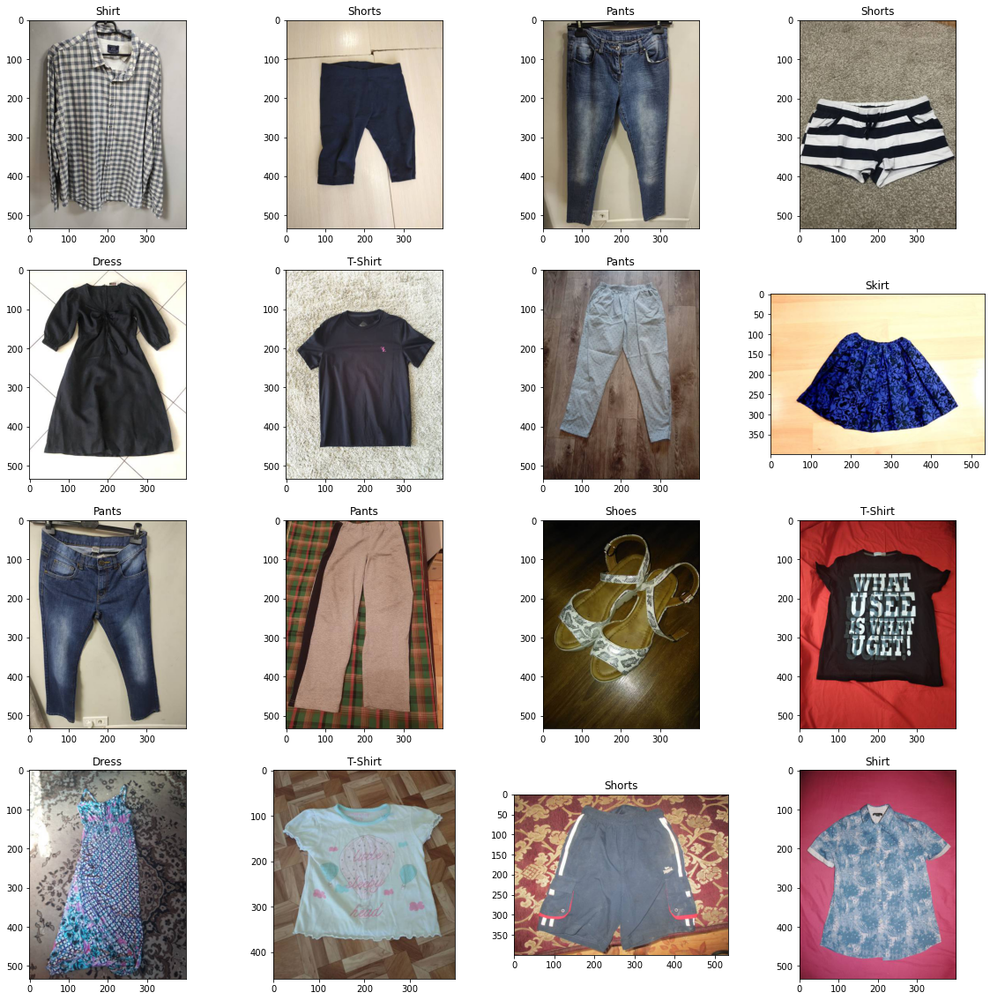

In [26]:
plt.figure(figsize=(20, 20))
for i in range(16):
    ax = plt.subplot(4, 4, i+1)
    show_random_training_image()

# Training the model

In [27]:
train_datagen = ImageDataGenerator(rescale=1./255,
                                  rotation_range=20,
                                  width_shift_range=0.2,
                                  height_shift_range=0.2,
                                  zoom_range=0.2,
                                  horizontal_flip=True,
                                  validation_split=0.1)

train_generator = train_datagen.flow_from_dataframe(
    dataframe=data_1,
    directory=TRAINING_DIR,
    x_col='image',
    y_col='label',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    subset='training'
)

validation_generator = train_datagen.flow_from_dataframe(
    dataframe=data_1,
    directory=TRAINING_DIR,
    x_col='image',
    y_col='label',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    subset='validation'
)

Found 4153 validated image filenames belonging to 11 classes.
Found 461 validated image filenames belonging to 11 classes.


In [28]:
class_names = train_generator.class_indices
class_names

{'Dress': 0,
 'Hat': 1,
 'Hoodie': 2,
 'Longsleeve': 3,
 'Outwear': 4,
 'Pants': 5,
 'Shirt': 6,
 'Shoes': 7,
 'Shorts': 8,
 'Skirt': 9,
 'T-Shirt': 10}

## Using Transfer learning 

In [29]:
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2

pre_trained_model = MobileNetV2(input_shape=(224, 224, 3),
                                include_top=False,
                                weights='imagenet')

for layer in pre_trained_model.layers:
    layer.trainable = True

pre_trained_model.summary()

last_layer = pre_trained_model.get_layer('out_relu')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                              

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [30]:
x = Flatten()(last_output)
x = Dropout(0.3)(x)
x = Dense(256, activation='relu', kernel_regularizer='l2')(x)
x = Dropout(0.3)(x)
x = Dense(len(class_names), activation='softmax')(x)           

model = Model(pre_trained_model.input, x)

In [31]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                             

 block_3_expand_relu (ReLU)     (None, 56, 56, 144)  0           ['block_3_expand_BN[0][0]']      
                                                                                                  
 block_3_pad (ZeroPadding2D)    (None, 57, 57, 144)  0           ['block_3_expand_relu[0][0]']    
                                                                                                  
 block_3_depthwise (DepthwiseCo  (None, 28, 28, 144)  1296       ['block_3_pad[0][0]']            
 nv2D)                                                                                            
                                                                                                  
 block_3_depthwise_BN (BatchNor  (None, 28, 28, 144)  576        ['block_3_depthwise[0][0]']      
 malization)                                                                                      
                                                                                                  
 block_3_d

 lization)                                                                                        
                                                                                                  
 block_7_expand (Conv2D)        (None, 14, 14, 384)  24576       ['block_6_project_BN[0][0]']     
                                                                                                  
 block_7_expand_BN (BatchNormal  (None, 14, 14, 384)  1536       ['block_7_expand[0][0]']         
 ization)                                                                                         
                                                                                                  
 block_7_expand_relu (ReLU)     (None, 14, 14, 384)  0           ['block_7_expand_BN[0][0]']      
                                                                                                  
 block_7_depthwise (DepthwiseCo  (None, 14, 14, 384)  3456       ['block_7_expand_relu[0][0]']    
 nv2D)    

                                                                                                  
 block_10_depthwise_relu (ReLU)  (None, 14, 14, 384)  0          ['block_10_depthwise_BN[0][0]']  
                                                                                                  
 block_10_project (Conv2D)      (None, 14, 14, 96)   36864       ['block_10_depthwise_relu[0][0]']
                                                                                                  
 block_10_project_BN (BatchNorm  (None, 14, 14, 96)  384         ['block_10_project[0][0]']       
 alization)                                                                                       
                                                                                                  
 block_11_expand (Conv2D)       (None, 14, 14, 576)  55296       ['block_10_project_BN[0][0]']    
                                                                                                  
 block_11_

 block_14_depthwise (DepthwiseC  (None, 7, 7, 960)   8640        ['block_14_expand_relu[0][0]']   
 onv2D)                                                                                           
                                                                                                  
 block_14_depthwise_BN (BatchNo  (None, 7, 7, 960)   3840        ['block_14_depthwise[0][0]']     
 rmalization)                                                                                     
                                                                                                  
 block_14_depthwise_relu (ReLU)  (None, 7, 7, 960)   0           ['block_14_depthwise_BN[0][0]']  
                                                                                                  
 block_14_project (Conv2D)      (None, 7, 7, 160)    153600      ['block_14_depthwise_relu[0][0]']
                                                                                                  
 block_14_

In [32]:
# learn_rate = LEARNING_RATE
# es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
# cb = ModelCheckpoint('mobilenet.h5', save_best_only=True)
# lrr= ReduceLROnPlateau(monitor='val_accuracy', factor=.1, patience=5, min_lr=1e-5)

# adam = Adam(learning_rate=learn_rate)
# model.compile(loss='categorical_crossentropy',optimizer=adam, metrics=['accuracy'])


# history = model.fit(train_generator, 
#                     epochs=EPOCHS,
#                     validation_data=validation_generator, 
#                     callbacks=[es, cb, lrr])

Epoch 1/100
130/130 [==============================] - 58s 352ms/step - loss: 6.4872 - accuracy: 0.4953 - val_loss: 12.0449 - val_accuracy: 0.0738 - lr: 0.0010
Epoch 2/100
130/130 [==============================] - 40s 309ms/step - loss: 3.4580 - accuracy: 0.6063 - val_loss: 14.6739 - val_accuracy: 0.2234 - lr: 0.0010
Epoch 3/100
130/130 [==============================] - 47s 359ms/step - loss: 2.3413 - accuracy: 0.6675 - val_loss: 6.6014 - val_accuracy: 0.2386 - lr: 0.0010
Epoch 4/100
130/130 [==============================] - 43s 328ms/step - loss: 1.8567 - accuracy: 0.7320 - val_loss: 8.6582 - val_accuracy: 0.2603 - lr: 0.0010
Epoch 5/100
130/130 [==============================] - 44s 341ms/step - loss: 1.7827 - accuracy: 0.7503 - val_loss: 11.0950 - val_accuracy: 0.2646 - lr: 0.0010
Epoch 6/100
130/130 [==============================] - 41s 318ms/step - loss: 1.1731 - accuracy: 0.8105 - val_loss: 9.4519 - val_accuracy: 0.3254 - lr: 0.0010
Epoch 7/100
130/130 [======================

130/130 [==============================] - 40s 304ms/step - loss: 0.0842 - accuracy: 0.9875 - val_loss: 0.5773 - val_accuracy: 0.8525 - lr: 1.0000e-05
Epoch 52/100
130/130 [==============================] - 40s 304ms/step - loss: 0.0749 - accuracy: 0.9882 - val_loss: 0.7298 - val_accuracy: 0.8286 - lr: 1.0000e-05
Epoch 53/100
130/130 [==============================] - 43s 334ms/step - loss: 0.0729 - accuracy: 0.9877 - val_loss: 0.6166 - val_accuracy: 0.8373 - lr: 1.0000e-05
Epoch 54/100
130/130 [==============================] - 41s 317ms/step - loss: 0.0693 - accuracy: 0.9884 - val_loss: 0.6145 - val_accuracy: 0.8373 - lr: 1.0000e-05
Epoch 55/100
130/130 [==============================] - 47s 364ms/step - loss: 0.0669 - accuracy: 0.9901 - val_loss: 0.6952 - val_accuracy: 0.8286 - lr: 1.0000e-05
Epoch 56/100
130/130 [==============================] - 41s 317ms/step - loss: 0.0688 - accuracy: 0.9884 - val_loss: 0.6589 - val_accuracy: 0.8460 - lr: 1.0000e-05
Epoch 56: early stopping


In [33]:
model = tf.keras.models.load_model('mobilenet.h5')

# Visualize model predictions

## model loss curves

In [34]:
def plot_loss_curves(history):
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']

    epochs = range(len(history.history['loss']))

    # Plot loss
    plt.plot(epochs, loss, label='training_loss')
    plt.plot(epochs, val_loss, label='val_loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.legend()

    # Plot accuracy
    plt.figure()
    plt.plot(epochs, accuracy, label='training_accuracy')
    plt.plot(epochs, val_accuracy, label='val_accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.legend()

In [35]:
# plot_loss_curves(history)

In [36]:
loss, accuracy = model.evaluate(validation_generator)

15/15 [==============================] - 4s 256ms/step - loss: 0.5625 - accuracy: 0.8503


In [37]:
print(f"Model Loss is {loss} and Accuracy is {100*np.round(accuracy, 4)}%")

Model Loss is 0.5624716877937317 and Accuracy is 85.03%


##  Prediction on validation Images

In [38]:
classes = list(train_generator.class_indices.keys())

In [39]:
def predict_val_image(index):
    predictions =  model.predict(val_images, verbose=0)[index]
    true_label = classes[val_labels[index].argmax()]
    predicted_label = classes[predictions.argmax()] 

    if(true_label== predicted_label):
        color = 'green'  
    else:
        color = 'red'

    plt.title(f"True : {true_label} Predicted: {predicted_label}", color=color)
    plt.imshow(val_images[index])
    plt.axis('off')

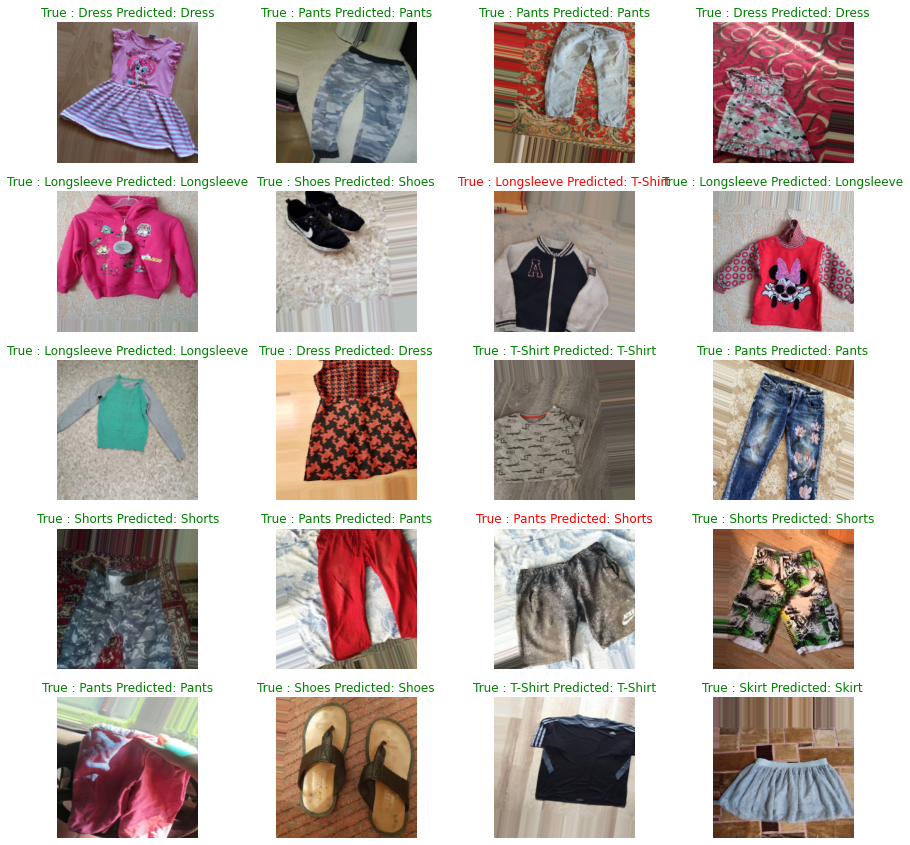

In [40]:
val_images, val_labels = validation_generator.next()
plt.figure(figsize=(15, 15))
for i in range(20):
    ax = plt.subplot(5, 4, i + 1)
    predict_val_image(i)

In [41]:
custom_dir = './data/custom_images/'

In [42]:
custom_paths = []
for image in os.listdir(custom_dir):
        custom_paths.append(custom_dir+'/'+image)

In [43]:
def predict_random_image():
    path = random.choice(custom_paths)
    image = tf.keras.preprocessing.image.load_img(path, target_size=(224, 224))
    input_arr = tf.keras.preprocessing.image.img_to_array(image)
    input_arr = np.array([input_arr])
    input_arr = input_arr.astype('float32') / 255.
    predictions = model.predict(input_arr, verbose=0)
    series = pd.Series(predictions[0], index=classes)
    predicted_classes = np.argsort(predictions)
    predictions.sort()
    plt.title(f"{classes[predicted_classes[0][-1]]} - {round(predictions[0][-1] * 100,2)}% \n{classes[predicted_classes[0][-2]]} - {round(predictions[0][-2] * 100,2)}% \n{classes[predicted_classes[0][-3]]} - {round(predictions[0][-2] * 100,3)}%")
    plt.imshow(image)
    plt.axis('off')

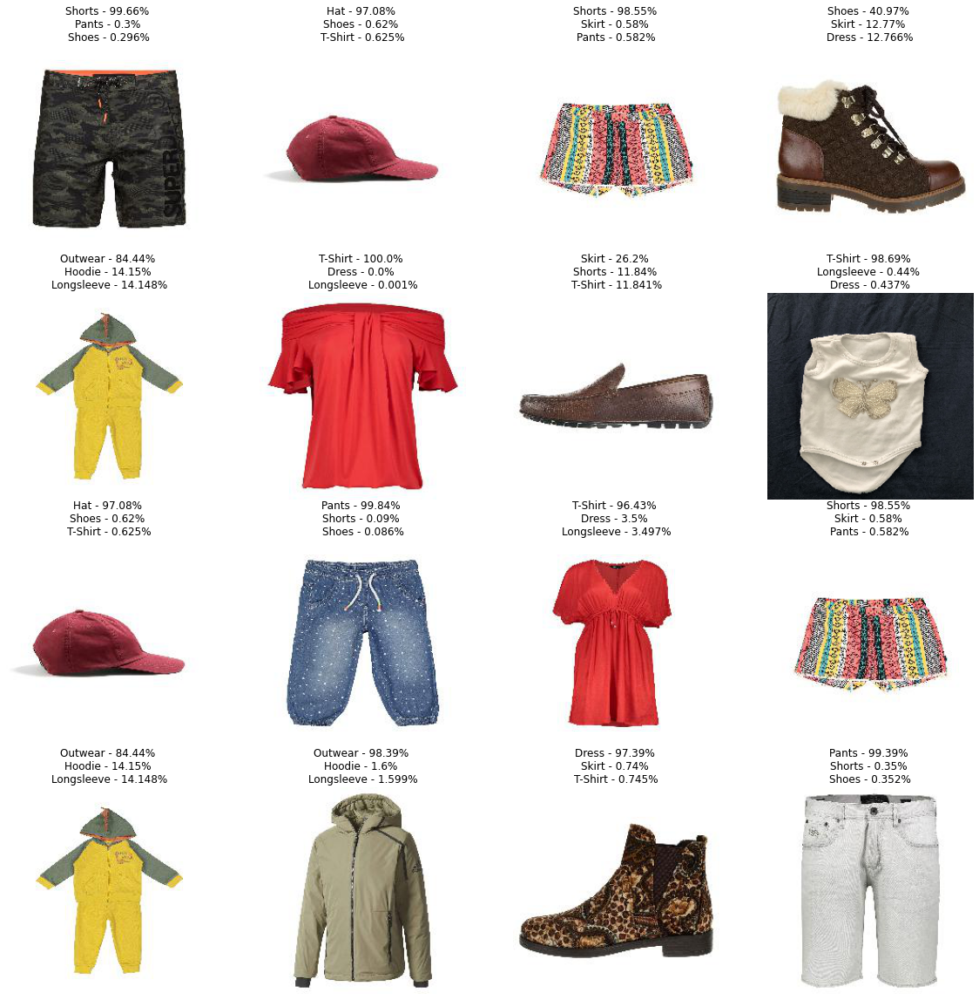

In [44]:
plt.figure(figsize=(20, 20))
for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    predict_random_image()

In [45]:
def predict_probabilities_custom_images(index):
    path = custom_paths[index]
    image = tf.keras.preprocessing.image.load_img(path, target_size=(224, 224))
    input_arr = tf.keras.preprocessing.image.img_to_array(image)
    input_arr = np.array([input_arr])
    input_arr = input_arr.astype('float32') / 255.
    predictions = model.predict(input_arr)
    predicted_class = np.argmax(predictions, axis=-1)
    series = pd.Series(predictions[0], index=classes)
    plt.figure(figsize=(5,5))
    plt.imshow(image)
    plt.axis('off')
    plt.title(classes[predicted_class[0]])
    plt.show() 
    fig = px.bar(series)
    fig.show()

1/1 [==============================] - 0s 16ms/step


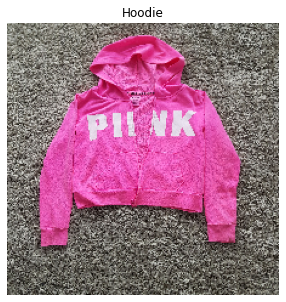

1/1 [==============================] - 0s 17ms/step


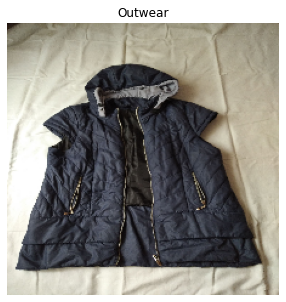

1/1 [==============================] - 0s 19ms/step


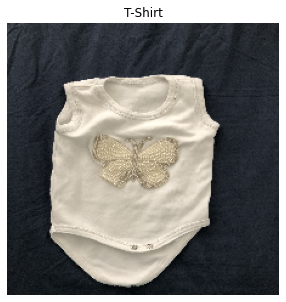

1/1 [==============================] - 0s 17ms/step


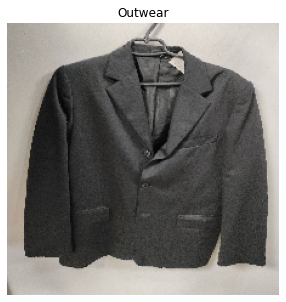

1/1 [==============================] - 0s 17ms/step


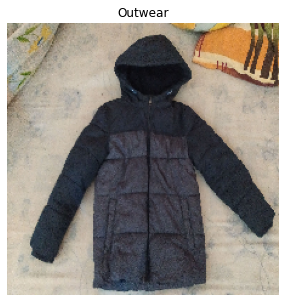

1/1 [==============================] - 0s 17ms/step


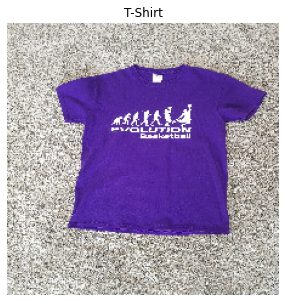

1/1 [==============================] - 0s 17ms/step


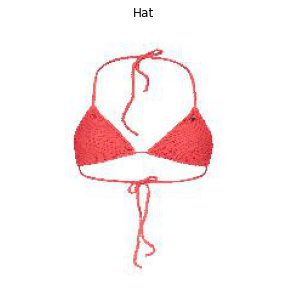

1/1 [==============================] - 0s 16ms/step


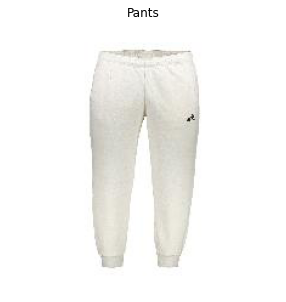

1/1 [==============================] - 0s 23ms/step


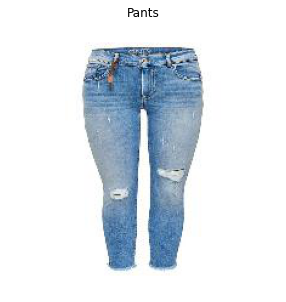

1/1 [==============================] - 0s 21ms/step


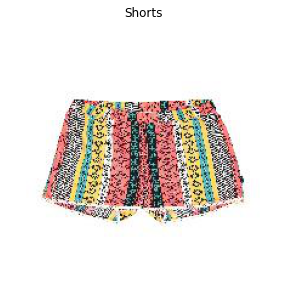

1/1 [==============================] - 0s 18ms/step


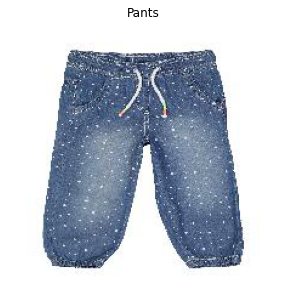

1/1 [==============================] - 0s 17ms/step


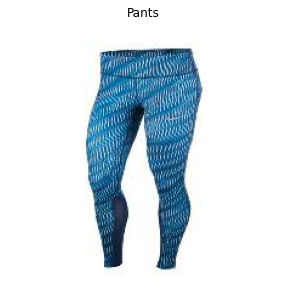

1/1 [==============================] - 0s 17ms/step


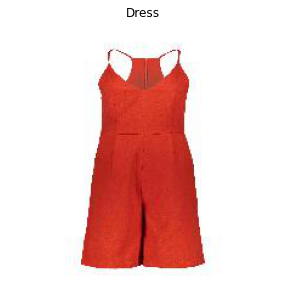

1/1 [==============================] - 0s 16ms/step


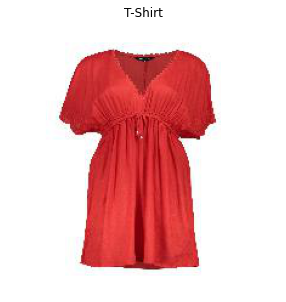

1/1 [==============================] - 0s 16ms/step


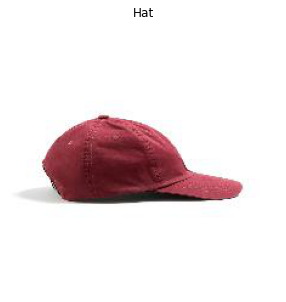

1/1 [==============================] - 0s 16ms/step


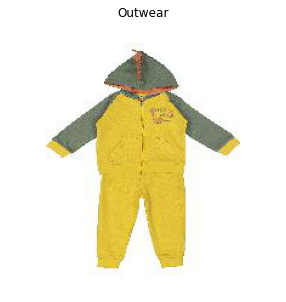

1/1 [==============================] - 0s 18ms/step


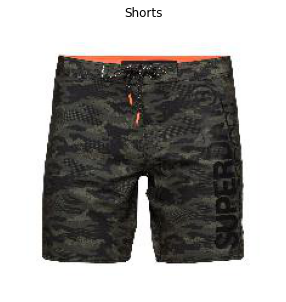

1/1 [==============================] - 0s 17ms/step


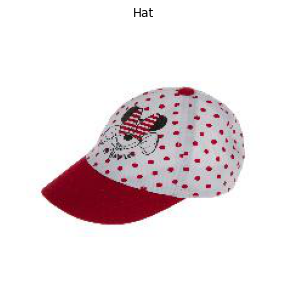

1/1 [==============================] - 0s 19ms/step


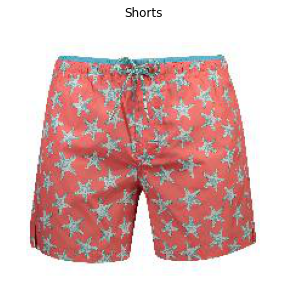

1/1 [==============================] - 0s 17ms/step


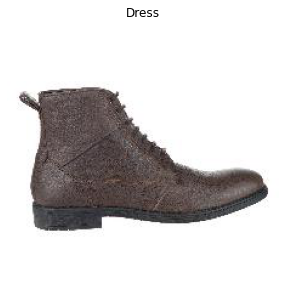

1/1 [==============================] - 0s 19ms/step


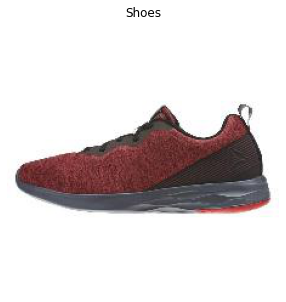

1/1 [==============================] - 0s 19ms/step


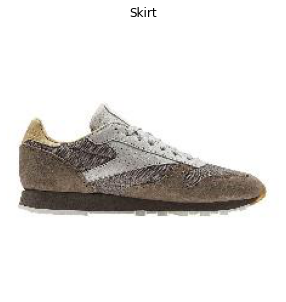

1/1 [==============================] - 0s 21ms/step


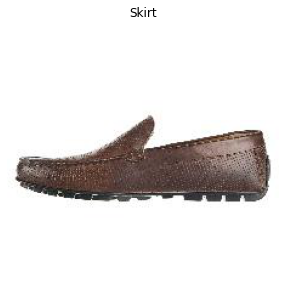

1/1 [==============================] - 0s 24ms/step


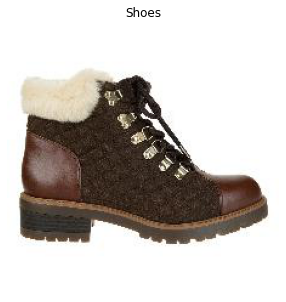

1/1 [==============================] - 0s 22ms/step


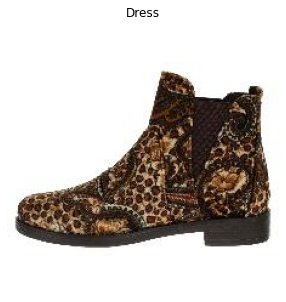

1/1 [==============================] - 0s 20ms/step


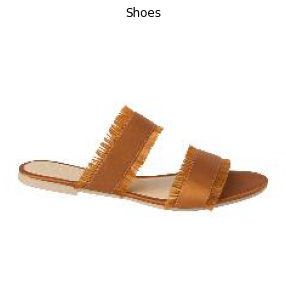

1/1 [==============================] - 0s 19ms/step


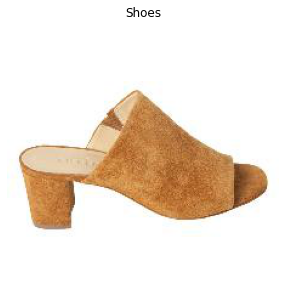

1/1 [==============================] - 0s 18ms/step


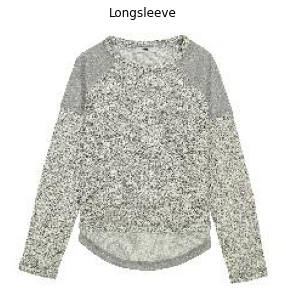

1/1 [==============================] - 0s 17ms/step


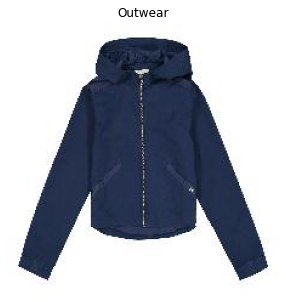

1/1 [==============================] - 0s 16ms/step


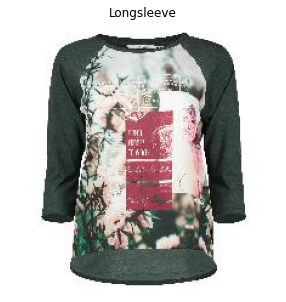

1/1 [==============================] - 0s 16ms/step


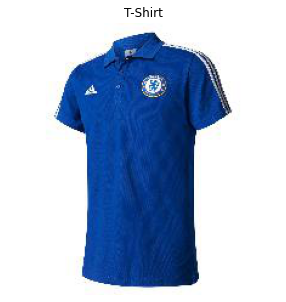

1/1 [==============================] - 0s 17ms/step


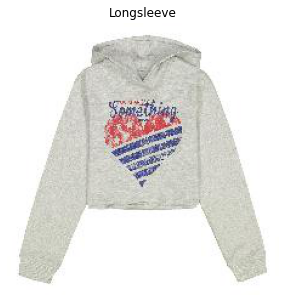

1/1 [==============================] - 0s 29ms/step


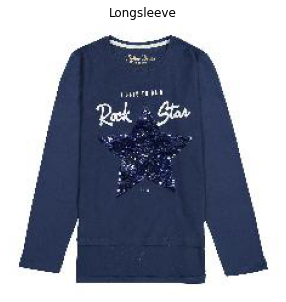

1/1 [==============================] - 0s 19ms/step


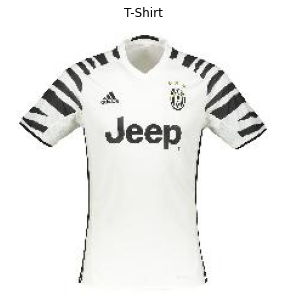

1/1 [==============================] - 0s 20ms/step


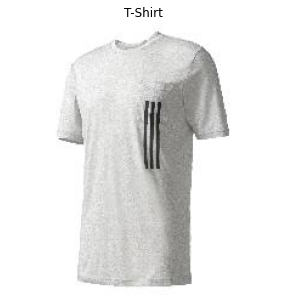

1/1 [==============================] - 0s 20ms/step


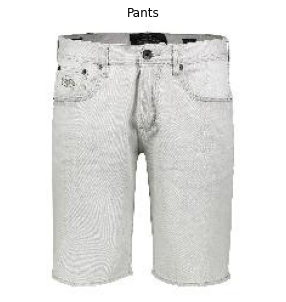

1/1 [==============================] - 0s 23ms/step


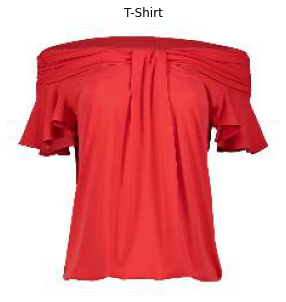

1/1 [==============================] - 0s 17ms/step


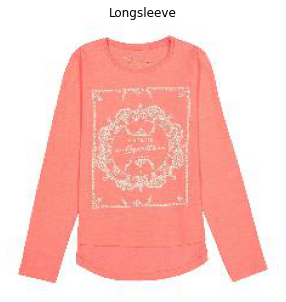

1/1 [==============================] - 0s 18ms/step


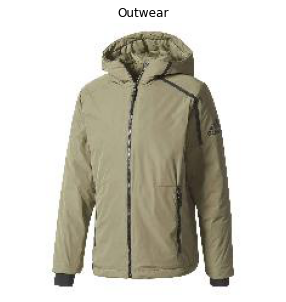

1/1 [==============================] - 0s 19ms/step


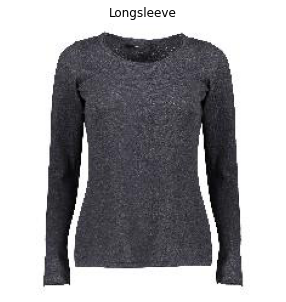

In [46]:
samples = len(custom_paths)
for i in range(samples):
    predict_probabilities_custom_images(i)